## TODO

* clean vital sign columns (caitlin)
* summarise cat breeds (isabell)
* examination text clean-up (nushki)
* make data compatible with bradley data (caitlin, isabell, nushki)
* make large cat dataset compatible with bradley data (ruth, leonie)

In [224]:
import pandas as pd
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 50)
import numpy as np

import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

In [225]:
columns = ['DatabaseName', 'PatientNumber', 'ClientNumber', 'ConsultationNumber', 'ItemName', 'Units',
           'ItemLabel', 'ClinicCode', 'ConsultingVet', 'PatientDesexed', 'DeceasedDate',
           'VisitDate', 'ConsultationDate', 'ExaminationText' ,'PatientSpecies', 'PatientBreed',
           'PatientColour', 'PatientSex', 'PatientDoB', 'Insured', 'weight', 'temperature',
           'HeartRate', 'BodyScore', 'DentalGrade', 'RespRate', 'PainScore', 'BP', 'CRT', 'MMColour']

In [226]:
data_dir = "../Data/vet_compass/"
data = pd.read_csv(data_dir + 'STR024A03 20190719 sample x10,000.csv', header=None, names = columns)

/usr/local/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning:

Columns (1,2,3,19,20,21,22,25,27) have mixed types. Specify dtype option on import or set low_memory=False.



In [227]:
data['VisitDate']= pd.to_datetime(data['VisitDate']).dt.date
data['ConsultationDate']= pd.to_datetime(data['ConsultationDate']).dt.date 
data['DeceasedDate']= pd.to_datetime(data['DeceasedDate']).dt.date
data['PatientDoB']= pd.to_datetime(data['PatientDoB']).dt.date
data['PatientNumber'] = data['PatientNumber'].astype("str")

In [228]:
data['weight'] = data['weight'].str.replace(r'\D*(\d+\.?\d*)\D*',r'\1')
data['weight'] = data['weight'].str.replace(r'^\D+$', "NaN")
data['weight'] = data['weight'].astype("float")
weightMask = data['weight'] > 20
data.loc[weightMask,'weight']/=1000
weightMask = data['weight'] == 0
data.loc[weightMask, 'weight'] = np.nan

___

## tidy data plotting

In [272]:
def plot_values(df, valueOfInterest, x_axis, group, moreValuesThan=30, fewerValuesThan=100):
    """
    Function to filter larger dataset into neatly plot-able dataframe and then plot it.
    Inputs: 
    - valueOfInterest: String (Column name)
    - x_axis: String (Column name)
    - group: String (Column name) - e.g. "PatientNumber" returns one line per PatientNumber
    - moreValuesThan: Int
    - fewerValuesThan: Int
    Returns the number of lines that would be plotted and the figure.
    """
    
    df = df.drop_duplicates([valueOfInterest, x_axis, group])

    smallerData = df[[group, x_axis, valueOfInterest]].set_index([group, x_axis]).reset_index().set_index(group)
    mask = pd.notnull(smallerData[valueOfInterest])
    
    smallerData = smallerData[mask]
    
    numberCountDf = smallerData.groupby(group).count()
    queryString = valueOfInterest + ">" +str(moreValuesThan) + " and " + valueOfInterest + "<" +str(fewerValuesThan) 
    filterIndex = numberCountDf.query(queryString).index
    plotdata = smallerData.loc[filterIndex]
    
#     print(plotdata.head(100))
    
    plotdata = plotdata.sort_values([x_axis])
    count = len(plotdata.groupby(group))
    return (count, px.line(plotdata.reset_index(), x = x_axis, y = valueOfInterest, line_group=group, hover_name=group, color = group, log_y = False, template="plotly_dark"))

In [273]:
valueOfInterest = "weight"
x_axis = "ConsultationDate"
group = "PatientNumber"

In [275]:
count, fig = plot_values(data, valueOfInterest, x_axis, group, 30, 40)
print(str(count) + " " + group + "s to plot")

39 PatientNumbers to plot


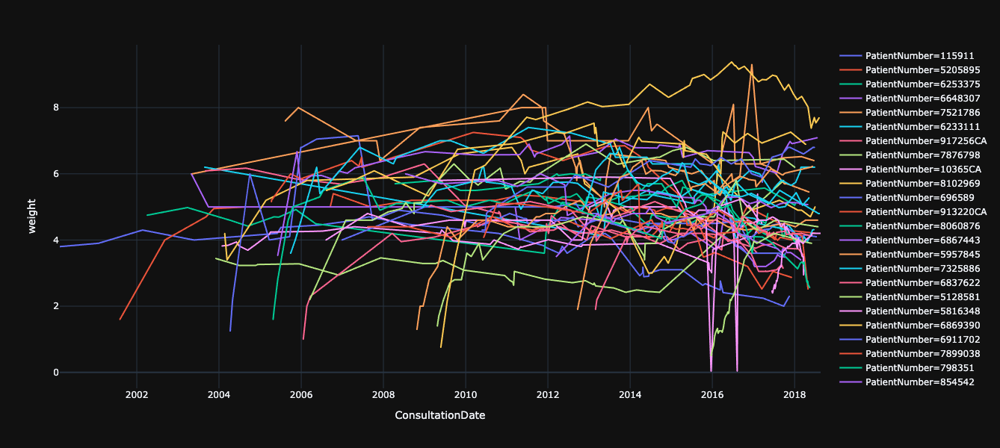

In [276]:
fig

___

### playing with data vis incrementally

In [234]:
smallerData = data[["PatientNumber", "ConsultationDate", "weight"]]
smallerData = smallerData.set_index(["PatientNumber", "ConsultationDate"])
smallerData = smallerData.reset_index().set_index("PatientNumber")
mask = pd.notnull(smallerData.weight)

In [235]:
smallerData = smallerData[mask]

In [236]:
numberCount = smallerData.groupby('PatientNumber').count()

In [237]:
filterindex = numberCount.query('weight > 250').index

In [238]:
plotdata = smallerData.loc[filterindex]

In [239]:
plotdata = plotdata.sort_values(["ConsultationDate"])

In [240]:
len(set(plotdata.index))

27

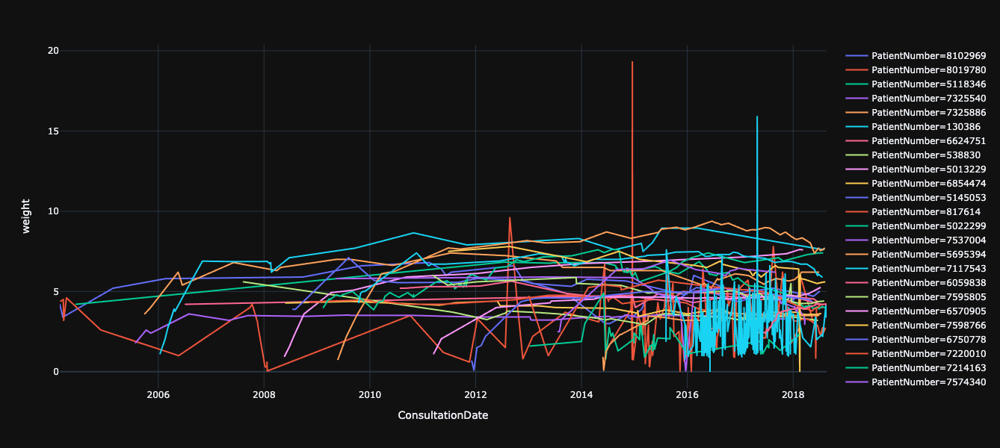

In [241]:
import plotly.express as px
fig = px.line(plotdata.reset_index(), x = "ConsultationDate", y = "weight", line_group="PatientNumber", hover_name="PatientNumber", color = "PatientNumber", log_y = False, template="plotly_dark")
fig.show()

___

## Breeds

In [242]:
smallerData = data[["PatientNumber", "PatientBreed", "weight"]]

In [243]:
mask = pd.notnull(smallerData.weight)
smallerData = smallerData.loc[mask]

In [252]:
smallerData.groupby('PatientNumber').agg({'PatientBreed': "last",'weight':"median"}).groupby("PatientBreed").agg({"weight":["mean", "count"]})

weight      
                                      mean count
PatientBreed                                    
Abyssinian                        4.577903    31
Abyssinian X                      4.635000     8
American Bobtail, Long Haired X   4.800000     1
American Short Hair               4.482500     4
Arabian Mau                       6.600000     1
Australian Mist                   4.931875     8
Balinese                          4.906667     6
Balinese X                        4.650000     2
Beagle                           12.650000     1
Bengal                            4.624521    73
Bengal X                          4.402500    20
Birman                            4.175921    76
Birman X                          4.427500     6
Bombay                            4.800000     1
British Blue                      4.964167    12
British Blue X                    5.226071    14
British Long Hair X               4.600000     1
British Short Hair                4.861327    81
British Short Hair X              5.373500    10
Burmese                           4.243300   297
Burmese X                         4.589603    63
Burmilla                          4.586667    15
Burmilla X                        5.600000     1
Calico                            2.700000     1
Chartreux X                       4.960000     1
Chicken                           2.000000     1
Chinchilla                        3.510000    14
Chinchilla X                      3.991250    12
Cornish Rex                       3.905000     8
Devon Rex                         4.189216    51
Devon Rex X                       5.200000     3
Domestic Long Hair                4.762865   686
Domestic Medium Hair              4.158577   869
Domestic Semi Long Hair           3.071176    17
Domestic Short Hair               4.412869  4380
Don Hairless                      4.700000     1
Egyptian Mau X                    4.950000     2
European Short Hair               1.730000     1
Exotic Long Hair                  4.200000     1
Exotic Short Hair                 3.162708    24
Exotic Short Hair X               4.867500     4
Ferret                            0.650000     1
Foreign White                     2.600000     1
Himalayan                         4.035833    24
Himalayan X                       4.581774    31
Javanese                          3.250000     1
Korat                             2.746250     8
Laperm, Long Hair                 6.950000     1
Laperm, Short Hair X              3.900000     1
Layanese                          5.750000     3
Maine Coon                        5.940750    60
Maine Coon X                      5.988235    17
Manx                              4.639107    28
Manx X                            4.201429    14
Moggie                            4.195000     8
Moggie X                          0.870000     1
Munchkin Short Hair               3.500000     1
Munchkin Short Hair X             3.500000     1
Norwegian Forest                  5.120000    15
Norwegian Forest X                2.845000     2
Ocicat                            3.745000     4
Oriental                          4.077000    20
Oriental Short Hair               4.200000     3
Oriental Short Hair X             3.850000     2
Oriental X                        4.945000     4
Other                             4.369737    19
Persian                           3.974821    84
Persian X                         4.078662    68
Ragamuffin                        4.300000     1
Ragdoll                           3.986254   504
Ragdoll X                         3.607289   142
Russian Blue                      4.831218    78
Russian Blue X                    4.262283    46
Russian White                     5.000000     1
Scottish Fold                     4.124400    25
Scottish Fold X                   3.620000     4
Scottish Shorthair                4.100000     5
Selkirk Rex                       2.975000     2
Siamese                           4.068015    66
Siamese X         

In [278]:
data[data["PatientBreed"] == "Beagle"]

,DatabaseName,PatientNumber,ClientNumber,ConsultationNumber,ItemName,Units,ItemLabel,ClinicCode,ConsultingVet,PatientDesexed,DeceasedDate,VisitDate,ConsultationDate,ExaminationText,PatientSpecies,PatientBreed,PatientColour,PatientSex,PatientDoB,Insured,weight,temperature,HeartRate,BodyScore,DentalGrade,RespRate,PainScore,BP,CRT,MMColour
128902,RxNSW,7522258,1.11153e+07,15390023,NaN,NaN,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Castration / Desexing,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128918,RxNSW,7522258,1.11153e+07,15393841,Acp Injection 10mg/ml (20),0.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128919,RxNSW,7522258,1.11153e+07,15393841,Anaesthesia - No Charge,2.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128920,RxNSW,7522258,1.11153e+07,15393841,Castrate <10kg GAH 20,1.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128921,RxNSW,7522258,1.11153e+07,15393841,Examination - No Charge,1.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128922,RxNSW,7522258,1.11153e+07,15393841,F3 IV Fluids During Surgery,1.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128923,RxNSW,7522258,1.11153e+07,15393841,Hospitalisation - No Charge,1.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128924,RxNSW,7522258,1.11153e+07,15393841,Meloxicam Injection 5Mg/ml,0.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128925,RxNSW,7522258,1.11153e+07,15393841,Metacam (Meloxicam) Chews 1mg,0.00,12/12/2013 14:58:38 PM : Expiry:12/2013 Vet: D...,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
128926,RxNSW,7522258,1.11153e+07,15393841,Methadone 20ml (S8) (20),0.00,NaN,118,SR2,1,NaT,2013-12-12,2013-12-12,Desexing Appointment Notes: klf History: Exami...,Cat,Beagle,Tan & White,Male,2012-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


___

## my weird dataframes and dictionaries

In [35]:
# smaller_df = data.head(100)

patientdata = pd.DataFrame()
patientvisits = dict()
p = 0
pTotal = len(set(data["PatientNumber"]))
for i in set(data["PatientNumber"]):
    patientvisits[i] = dict()
    patient = data[data["PatientNumber"] == i]
    consultations = list(patient["ConsultationDate"])
    
    dateOfBirth = list(patient["PatientDoB"])[0]
    
    sex = list(patient["PatientSex"])[-1]
    colour = list(patient["PatientColour"])[-1]
    breed = list(patient["PatientBreed"])[-1]
    deceased = len([x for x in pd.notna(patient["DeceasedDate"]) if x == True]) > 0 
    
    row = pd.DataFrame({"id": [i], 
                       "age": [max(consultations) - dateOfBirth],
                       "numberObservations": [len(set(consultations))],
                       "timespanObservations": [max(consultations) - min(consultations)],
                       "deceased": deceased,
                       "sex": [sex],
                       "breed": [breed],
                       "colour": [colour]
                       })
   
    for j in list(set(patient["ConsultationDate"])):
        visitdata = patient[patient["ConsultationDate"] == j]
        patientvisits[i][j] = {"weight": visitdata["weight"], "temp": visitdata["temperature"], 
                               "hr": visitdata["HeartRate"], "bs": visitdata["BodyScore"],
                               "dg": visitdata["DentalGrade"],"rr": visitdata["RespRate"], 
                               "ps": visitdata["PainScore"]}
    p = p + 1
    if p%100 == 0:
        print(str(p/pTotal*100) + "% of patient records written")
    patientdata = patientdata.append(row)

1.001001001001001% of patient records written
2.002002002002002% of patient records written
3.003003003003003% of patient records written
4.004004004004004% of patient records written
5.005005005005005% of patient records written
6.006006006006006% of patient records written
7.007007007007007% of patient records written
8.008008008008009% of patient records written
9.00900900900901% of patient records written
10.01001001001001% of patient records written
11.01101101101101% of patient records written
12.012012012012011% of patient records written
13.013013013013014% of patient records written
14.014014014014014% of patient records written
15.015015015015015% of patient records written
16.016016016016017% of patient records written
17.017017017017018% of patient records written
18.01801801801802% of patient records written
19.01901901901902% of patient records written
20.02002002002002% of patient records written
21.02102102102102% of patient records written
22.02202202202202% of patient

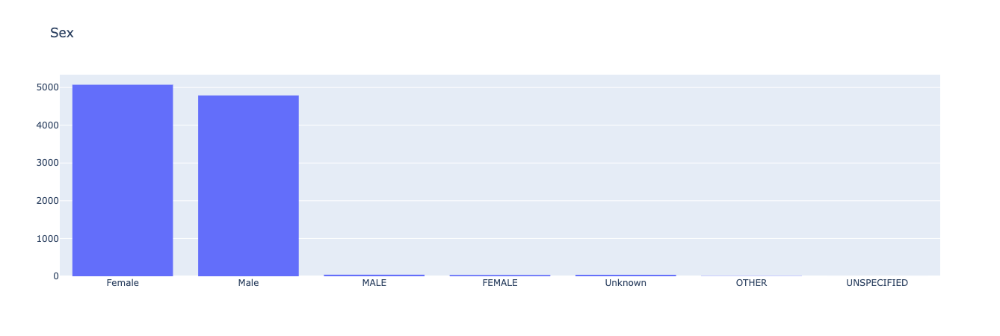

In [42]:
traces = []
traces.append(go.Histogram(
    x = patientdata["sex"]
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Sex")))

In [43]:
male = 5091 + 42
print(male)
female = 5402 + 34
print(female)
unknown = 44 + 2
print(unknown)
other = 10
print(other)

print(male+female+unknown+other)

5133
5436
46
10
10625


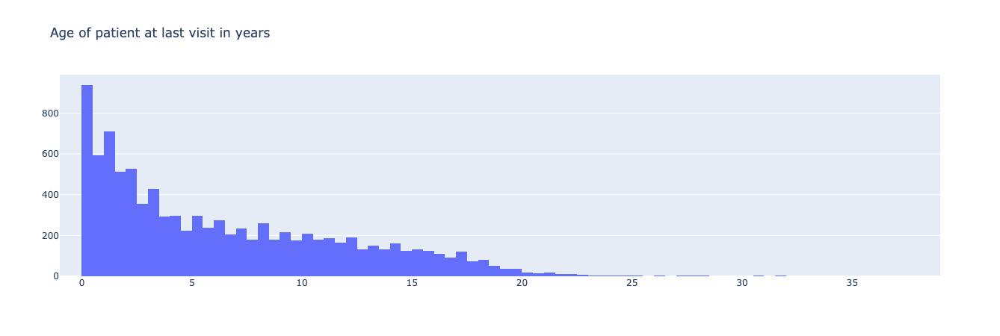

In [44]:
traces = []
traces.append(go.Histogram(
    x = patientdata["age"].dt.days/365,
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Age of patient at last visit in years")))

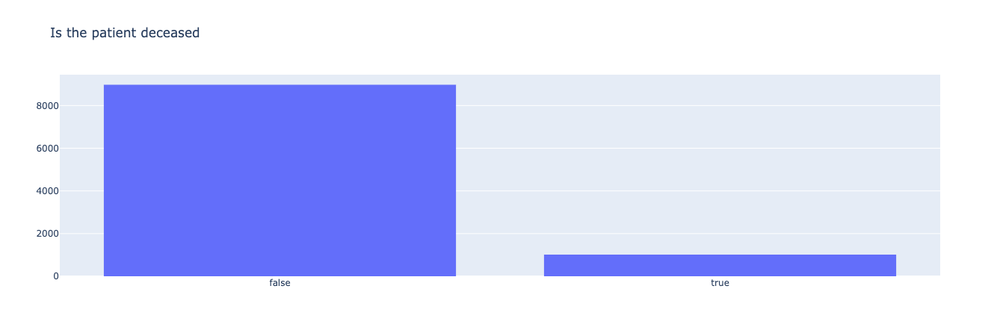

In [45]:
traces = []
traces.append(go.Histogram(
    x = patientdata["deceased"]
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Is the patient deceased")))

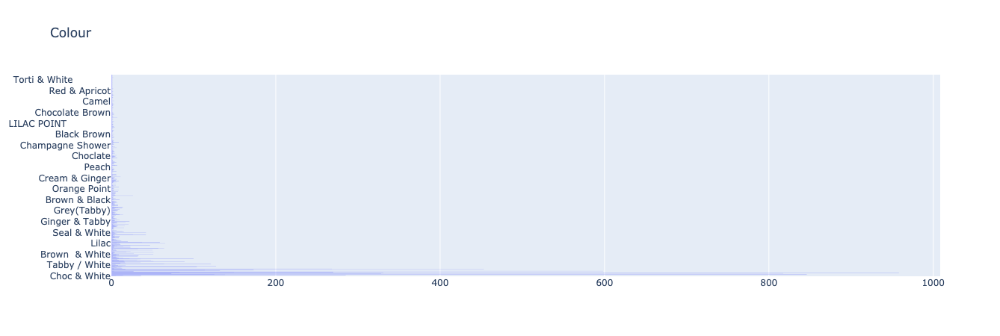

In [46]:
traces = []
traces.append(go.Histogram(
    y = patientdata["colour"]
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Colour")))

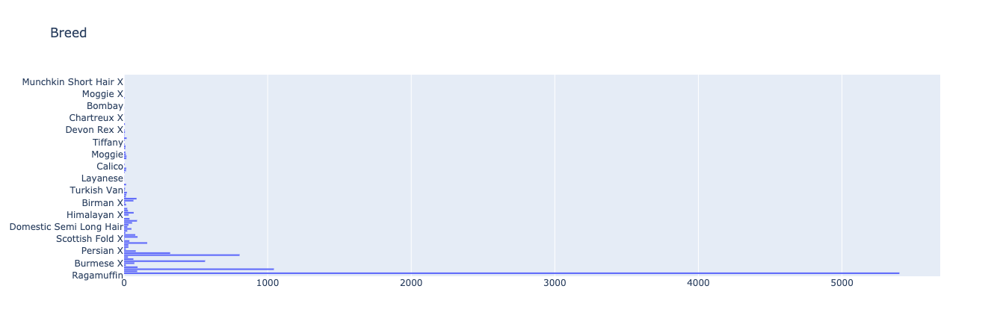

In [48]:
traces = []
traces.append(go.Histogram(
    y = patientdata["breed"]
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Breed")))

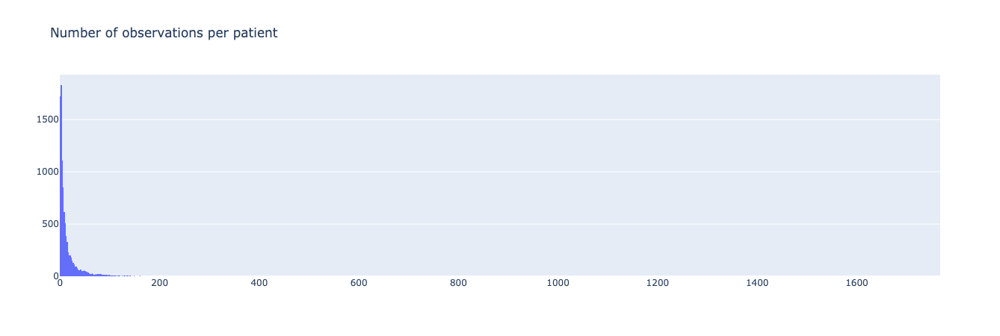

In [49]:
traces = []
traces.append(go.Histogram(
    x = patientdata["numberObservations"]
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Number of observations per patient")))

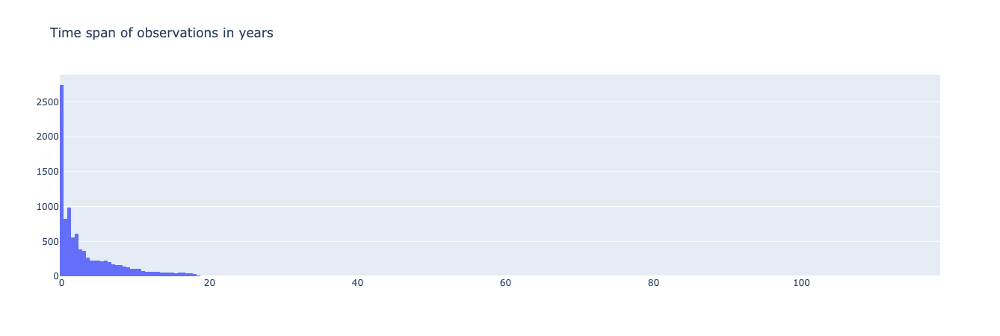

In [50]:
traces = []
traces.append(go.Histogram(
    x = patientdata["timespanObservations"].dt.days/365
))
iplot(go.Figure(data = traces, layout = go.Layout(title = "Time span of observations in years")))

## Observations per animal

In [251]:
datesOfVisits = dict()
for i in set(data["Patient Number"]):
    datesOfVisits[i]=[]
    for j in set(data[data["Patient Number"] == i]["Visit_Date"]):
        datesOfVisits[i].append(j)

In [252]:
numberOfVisitsPatients = dict()
for i in set(data["Patient Number"]):
    number = len(set(data[data["Patient Number"] == i]["Visit_Date"]))
    if number in numberOfVisitsPatients.keys():
        numberOfVisitsPatients[number].append(i)
    else: 
        numberOfVisitsPatients[number] = [i]

#### spread and age of animals

In [253]:
patientStats = dict()
for i in datesOfVisits:
    patientStats[i] = dict()
    patientStats[i]["ageAtLastVisit"] = datesOfVisits[i][-1] -list(set(data[data["Patient Number"] == i]["Patient_dob"]))[0]
    patientStats[i]["spanOfVisits"] = datesOfVisits[i][-1] - datesOfVisits[i][0]
    

### Visualisation

In [254]:
import plotly
import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

In [255]:
x = []
y = []
for i in numberOfVisitsPatients:
    x.append(i)
    y.append(len(numberOfVisitsPatients[i]))

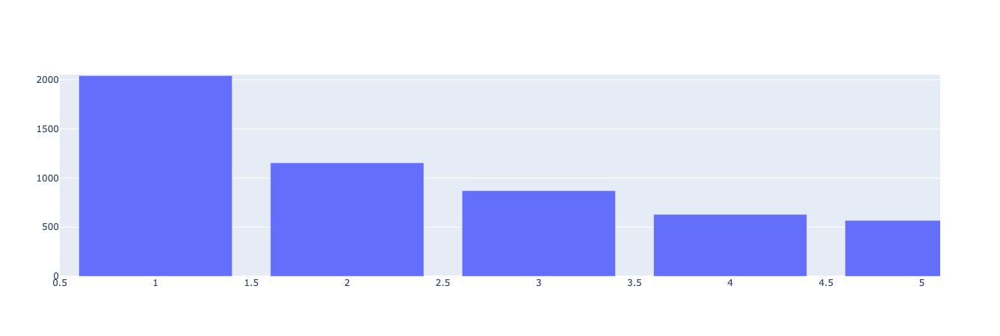

In [256]:
traces = []
traces.append(go.Bar(
        x = x, 
        y = y))
iplot(traces)

In [1]:
numberOfVisitsPatients[2]

NameError: name 'numberOfVisitsPatients' is not defined

## One patient only

In [258]:
patient_number = '7725132'
patient_data = data[data["Patient Number"] == patient_number]

In [259]:
patient_data

,Database Name,Patient Number,Client Number,Consultation Number,Item Name,Units,Item Label,Clinic Code,Consulting Vet,Patient Desexed,Deceased Date,Visit Date,Consultation Date,Examination Text,Patient Species,Patient Breed,Patient Colour,Patient Sex,Patient Date of Birth,Insured,weight,temperature,HeartRate,BodyScore,DentalGrade,RespRate,PainScore,BP,CRT,MMColour,Visit_Date,Consultation_Date,Deceased_Date,Patient_dob
687014,RxVIC,7725132,1.23457e+06,16780127,NaN,NaN,NaN,90,DM7,1,NaN,2015-12-04 10:45:51.000,2015-12-04 10:45:51.000,History: Examination: Laboratory: Assessment: ...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-04,2015-12-04,NaT,2002-12-20
687018,RxVIC,7725132,1.23457e+06,16783761,Account Fee,1.0,NaN,90,PL7,1,NaN,2015-12-05 12:09:43.000,2015-12-05 12:09:43.000,NaN,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-05,2015-12-05,NaT,2002-12-20
687019,RxVIC,7725132,1.23457e+06,16783761,Hills Cat Metabolic 3.85kg,1.0,NaN,90,PL7,1,NaN,2015-12-05 12:09:43.000,2015-12-05 12:09:43.000,NaN,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-05,2015-12-05,NaT,2002-12-20
687022,RxVIC,7725132,1.23457e+06,16799607,Hills Cat T/D 3.85Kg,1.0,NaN,90,LN2,1,NaN,2015-12-14 10:02:25.000,2015-12-14 10:02:25.000,Appointment Notes: Zydax History: Examination:...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-14,2015-12-14,NaT,2002-12-20
687025,RxVIC,7725132,1.23457e+06,16807632,Administration,1.0,NaN,90,DM7,1,NaN,2015-12-16 15:23:55.000,2015-12-16 15:23:55.000,No petty cash. Required Tacrolimus for client ...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-16,2015-12-16,NaT,2002-12-20
687108,RxVIC,7725132,1.23457e+06,16843276,!Miscellaneous Food,3.0,NaN,90,BC9,1,NaN,2003-02-17 00:00:00.000,2003-02-17 00:00:00.000,Original Vet : Charis N McLean ---------------...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-02-17,2003-02-17,NaT,2002-12-20
687109,RxVIC,7725132,1.23457e+06,16843390,!Miscellaneous Food,0.0,NaN,90,BC9,1,NaN,2003-02-24 00:00:00.000,2003-02-24 00:00:00.000,Original Vet : Charis N McLean ---------------...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-02-24,2003-02-24,NaT,2002-12-20
687116,RxVIC,7725132,1.23457e+06,16843643,!Miscellaneous Food,0.0,NaN,90,BC9,1,NaN,2003-03-11 00:00:00.000,2003-03-11 00:00:00.000,Original Vet : Charis N McLean ---------------...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-03-11,2003-03-11,NaT,2002-12-20
687117,RxVIC,7725132,1.23457e+06,16843671,!Miscellaneous Preventatives,0.0,NaN,90,KH1,1,NaN,2003-03-13 00:00:00.000,2003-03-13 00:00:00.000,Original Vet : Dr. Kirsten Hailstone B.Sc.;B.V...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,1.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-03-13,2003-03-13,NaT,2002-12-20
687118,RxVIC,7725132,1.23457e+06,16843671,F3 Vaccination,0.0,NaN,90,KH1,1,NaN,2003-03-13 00:00:00.000,2003-03-13 00:00:00.000,Original Vet : Dr. Kirsten Hailstone B.Sc.;B.V...,Cat,Domestic Medium Hair,Tabby,Male,2002-12-20 00:00:00.000,NaN,1.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2003-03-13,2003-03-13,NaT,2002-12-20


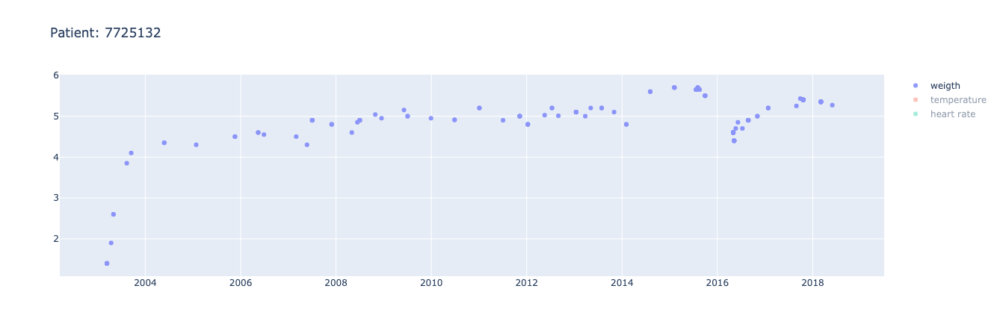

In [456]:
traces = []
traces.append(go.Scatter(
    x = patient_data["Visit_Date"], 
    y = patient_data["weight"], 
    mode = "markers", 
    opacity = 0.7, 
    name = "weigth"
))
traces.append(go.Scatter(
    x = patient_data["Visit_Date"], 
    y = patient_data["temperature"], 
    mode = "markers", 
    opacity = 0.7, 
    name = "temperature"
))
traces.append(go.Scatter(
    x = patient_data["Visit_Date"], 
    y = patient_data["HeartRate"], 
    mode = "markers", 
    opacity = 0.7, 
    name = "heart rate"
))
iplot(go.Figure(data = traces, layout = go.Layout(title= "Patient: " + patient_number)))

# Patients with CKD in examination text

In [189]:
len(data[pd.notnull(data['Examination Text'].str.contains("CKD"))])

604423

In [198]:
len(list(set(data[data['Examination Text'].str.contains("CKD") == True]["Patient Number"])))

197

In [199]:
ckd_patients = list(set(data[data['Examination Text'].str.contains("CKD") == True]["Patient Number"]))